In [ ]:
import json
from datetime import datetime

import ipywidgets
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from collections import Counter
from itertools import combinations
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import networkx as nx
from transformers import pipeline

In [ ]:
class conversation:
    def __init__(self, title, userMessages, GPTMessages, timestamp, totalConversation):
        self.title = title
        self.userMessages = userMessages
        self.GPTMessages = GPTMessages
        self.timestamp = timestamp
        self.totalConversation = totalConversation

class myMessages:
    def __init__(self, content,timestamp):
        self.content = content
        self.timestamp = timestamp
        self.tokens = []
        self.topic = ""

In [ ]:
with open("/content/conversations.json", "r") as file:
    dataFile = json.load(file)

myQuestions = []
conversations = []

for obj in dataFile:

    #Title of the conversation

    conversationTime = obj.get("create_time")
    conversationTitle = obj.get("title")
    conversationUserMessages = []
    conversationGPTMessages = []
    totalConversation = []

    mappings = obj.get("mapping", {})
    for mapping_id, mapping_obj in mappings.items():
        #Check if message exists
        message_obj = mapping_obj.get("message")
        if message_obj and "content" in message_obj:
            messageTime = message_obj.get("create_time")

            message_author = message_obj["author"].get("role")
            message_parts = message_obj["content"].get("parts", [])
            if message_parts:
                content = message_parts[-1]
                totalConversation.append(content)
                if message_author == "assistant":
                    conversationGPTMessages.append(content)
                elif message_author == "user":
                    myQuestions.append(myMessages(content,datetime.fromtimestamp(messageTime)))
                    conversationUserMessages.append(content)  # Add content to myMessages
            # else:
            # myMessages.append("No content in parts.")
        # else:

        # myMessages.append(f"No message content for mapping_id: {mapping_id}")
    conversations.append(conversation(conversationTitle, conversationUserMessages, conversationGPTMessages, datetime.fromtimestamp(conversationTime), totalConversation))


In [ ]:
for i in myQuestions:
    print(i.timestamp, i.content[0:20]);

In [ ]:
lemmatizer = WordNetLemmatizer()
stop_words = ["the", "a", "of", "and", "to", "i", "is", "in", "it", "you"]

def preprocess_content(messageObj):
    tokens = word_tokenize(messageObj.content.lower())  #Lowercase and tokenize
    tokens = [word for word in tokens if word.isalnum()]  #Remove non-alphanumeric tokens
    tokens = [word for word in tokens if word not in stop_words]  #Remove stop words
    tokens = [lemmatizer.lemmatize(word) for word in tokens]  #Lemmatize words
    tokens = [word for word in tokens if not word.isdigit()]
    return tokens

In [ ]:
!pip install nltk
import nltk

nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
for message in myQuestions:
    #message['tokens'] = preprocess_content(message)
    tokens = word_tokenize(message.content.lower())
    print(tokens)

['the', 'circuit', 'in', 'hw1.asc', 'is', 'a', 'model', 'for', 'a', '5v', 'dc', 'source', 'with', 'short-circuit', 'protection', '.', 'consequently', ',', 'rt', 'can', 'not', 'be', 'determined', 'by', 'measuring', 'isc', '.', 'perform', 'measurement', '(', 's', ')', 'on', 'this', 'circuit', 'to', 'find', 'rt', '.', 'the', 'circuit', 'in', 'the', 'box', 'labeled', '“', 'device', 'under', 'test', '”', 'must', 'not', 'be', 'modified', ';', 'any', 'additional', 'circuit', 'components', 'are', 'to', 'be', 'placed', 'outside', 'the', 'box', '.']
['what', 'is', 's1', 'used', 'for', 'and', 'how', 'do', 'i', 'find', 'the', 'rt']
['is', 'a', 'model', 'for', 'a', '5v', 'dc', 'source', 'with', 'short-circuit', 'protection', '.', 'consequently', ',', 'rt', 'can', 'not', 'be', 'determined', 'by', 'measuring', 'isc', '.', 'perform', 'measurement', '(', 's', ')', 'on', 'this', 'circuit', 'to', 'find', 'rt', '.', 'the', 'circuit', 'in', 'the', 'box', 'labeled', '“', 'device', 'under', 'test', '”', 'mus

In [ ]:
for message in myQuestions:
    message.tokens = preprocess_content(message)

In [ ]:
word_frequencies = Counter()

for message in myQuestions:
    word_frequencies.update(message.tokens)

print(word_frequencies.most_common(100))

[('for', 536), ('if', 529), ('that', 508), ('can', 454), ('endl', 393), ('be', 380), ('cout', 377), ('this', 366), ('what', 331), ('not', 309), ('int', 304), ('will', 298), ('a', 291), ('are', 287), ('we', 284), ('with', 273), ('have', 243), ('or', 243), ('do', 235), ('name', 206), ('an', 200), ('next', 199), ('string', 192), ('on', 191), ('ve', 190), ('include', 186), ('how', 185), ('else', 179), ('list', 171), ('player', 171), ('number', 168), ('like', 168), ('while', 167), ('function', 164), ('null', 163), ('but', 163), ('please', 154), ('object', 154), ('return', 154), ('use', 153), ('at', 151), ('should', 146), ('my', 145), ('one', 142), ('x', 140), ('by', 139), ('name1', 139), ('all', 137), ('temp', 136), ('from', 135), ('file', 135), ('bir', 135), ('name2', 134), ('head', 133), ('time', 131), ('which', 130), ('dnaseq', 124), ('project', 123), ('enter', 119), ('each', 118), ('there', 117), ('ha', 117), ('value', 115), ('code', 114), ('so', 112), ('our', 110), ('cin', 110), ('rand

In [ ]:
co_occurrences = defaultdict(int)

for message in myQuestions:
    tokens = message.tokens
    for word1, word2 in combinations(tokens, 2):  # Pair every two words in the same message
        co_occurrences[tuple(sorted([word1, word2]))] += 1

#Prints some of the co-occurrences
print(dict(list(co_occurrences.items())[:10]))

{('circuit', 'model'): 10, ('circuit', 'for'): 14, ('5v', 'circuit'): 10, ('circuit', 'dc'): 10, ('circuit', 'source'): 10, ('circuit', 'with'): 10, ('circuit', 'protection'): 10, ('circuit', 'consequently'): 10, ('circuit', 'rt'): 23, ('can', 'circuit'): 20}


In [ ]:
print(dict(list(co_occurrences.items())[:100]))

{('circuit', 'model'): 10, ('circuit', 'for'): 14, ('5v', 'circuit'): 10, ('circuit', 'dc'): 10, ('circuit', 'source'): 10, ('circuit', 'with'): 10, ('circuit', 'protection'): 10, ('circuit', 'consequently'): 10, ('circuit', 'rt'): 23, ('can', 'circuit'): 20, ('circuit', 'not'): 20, ('be', 'circuit'): 32, ('circuit', 'determined'): 10, ('by', 'circuit'): 10, ('circuit', 'measuring'): 10, ('circuit', 'isc'): 10, ('circuit', 'perform'): 10, ('circuit', 'measurement'): 13, ('circuit', 's'): 14, ('circuit', 'on'): 13, ('circuit', 'this'): 13, ('circuit', 'circuit'): 16, ('circuit', 'find'): 10, ('box', 'circuit'): 20, ('circuit', 'labeled'): 10, ('circuit', 'device'): 10, ('circuit', 'under'): 10, ('circuit', 'test'): 10, ('circuit', 'must'): 10, ('circuit', 'modified'): 10, ('any', 'circuit'): 10, ('additional', 'circuit'): 10, ('circuit', 'component'): 10, ('are', 'circuit'): 13, ('circuit', 'placed'): 10, ('circuit', 'outside'): 10, ('for', 'model'): 19, ('5v', 'model'): 3, ('dc', 'mode

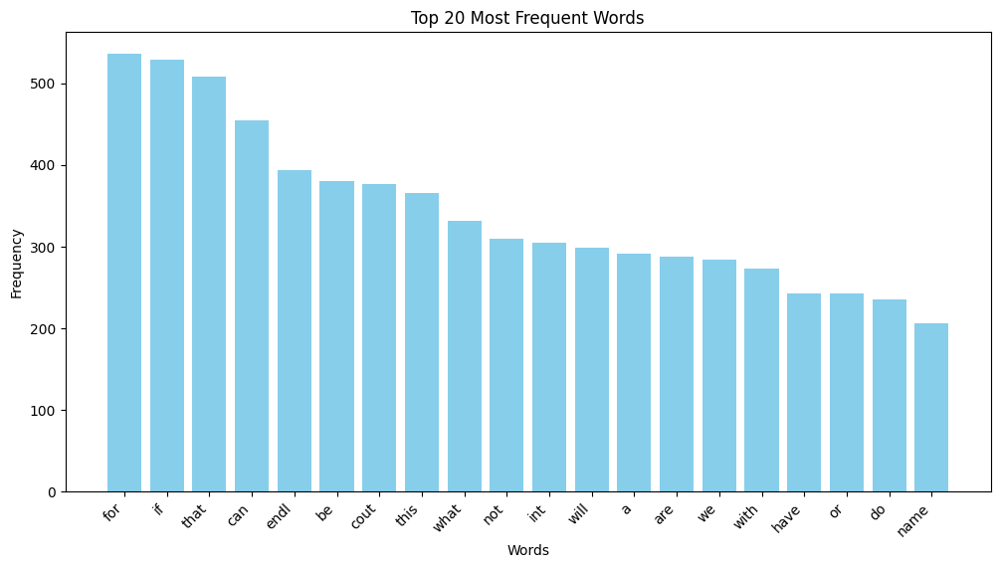

In [ ]:
#Gets the top 20 most frequent words
top_n = 20
most_common = word_frequencies.most_common(top_n)
words, counts = zip(*most_common)

#Bar chart
plt.figure(figsize=(12, 6))
plt.bar(words, counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 20 Most Frequent Words')
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119909 (\N{MATHEMATICAL ITALIC SMALL X}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119899 (\N{MATHEMATICAL ITALIC SMALL N}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


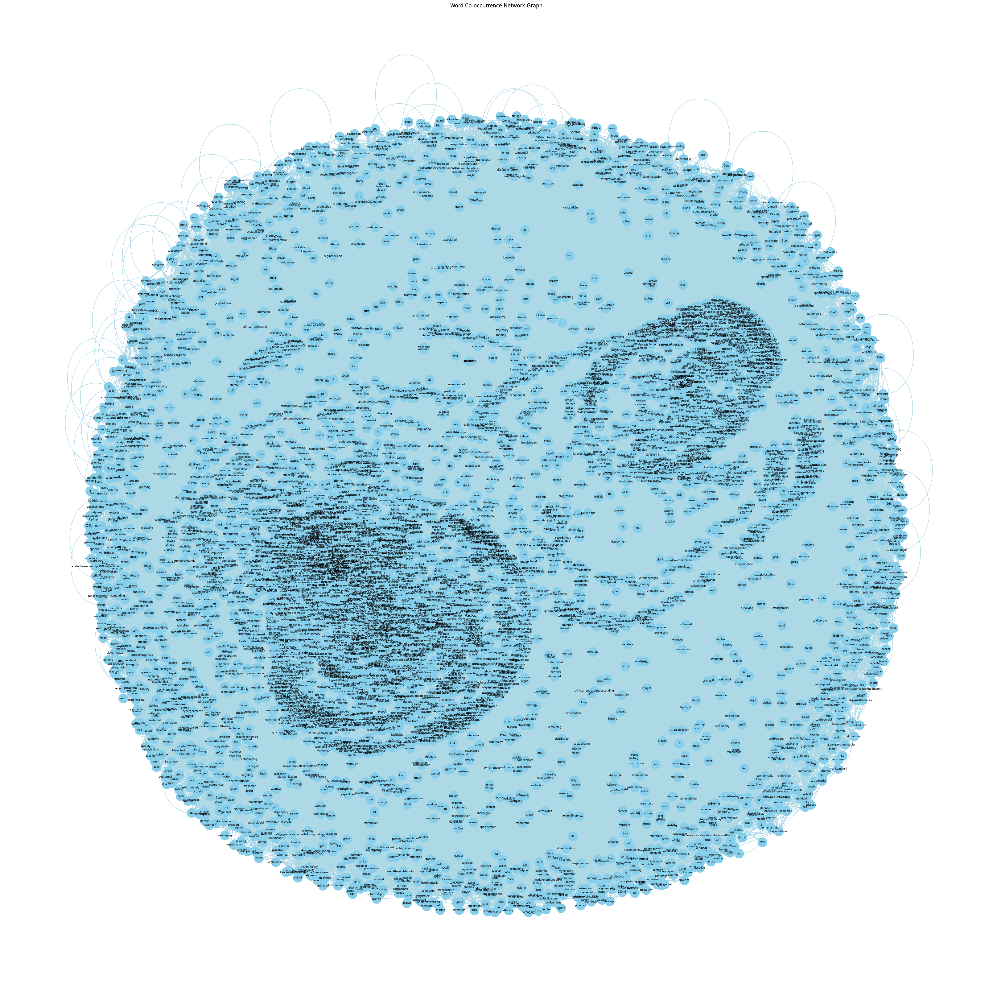

In [ ]:
#Creates a graph from co-occurrence data
G = nx.Graph()

#Adds edges with weights
for (word1, word2), count in co_occurrences.items():
    if count > 20 or count < 500:  # Optional: Filter out weak connections
        G.add_edge(word1, word2, weight=count)

#Draw the graph
plt.figure(figsize=(32, 32))
pos = nx.spring_layout(G, seed=42, k=0.9)  # Position nodes for better visualization
nx.draw(
    G, pos, with_labels=True, node_size=500, font_size=6, edge_color='lightblue',
    node_color='skyblue', linewidths=0.07
)
plt.title('Word Co-occurrence Network Graph')
plt.show()

In [ ]:
import random

randomizedMessages = random.sample(myQuestions, 500)

In [ ]:
candidateLabels = ["History",
                    "Computer Science and Programming",
                    "Mathematics",
                    "Natural Sciences",
                    "Literature",
                    "Electronic Circuits",
                    "Language",
                    "Health",
                    "Personal Life",
                    "Other",
                    "Digital System Design",
                    "Data Science"
                    ]

In [ ]:


for message in randomizedMessages:
    print(message.content)
    if(message.topic == ""):
      message.topic = candidateLabels[int(input("Enter the topic number: "))]

Streaming output truncated to the last 5000 lines.
    vector<int> scoreboard(numPlayers, 0);
    for(currentRound = 1; currentRound <= numRounds; currentRound++) {
        myMutex.lock();
        if(someoneWon) {
            time_t tt = chrono::system_clock::to_time_t(chrono::system_clock::now());
            struct tm *ptm = new struct tm;
            localtime_s(ptm, &tt);

            static mt19937 generator(time(0));
            uniform_int_distribution<int> distribution(randMin, randMax);
            targetNum = distribution(generator);

            printMutex.lock();
            cout << "---------------------------------------------------" << endl;
            if (currentRound == 1) {

                cout << "Game started at: " << put_time(ptm, "%X") << endl;
                cout << "Round 1 will start 3 seconds later" << endl << endl;
            } else {
                cout << "Round " << currentRound << " started at: " << put_time(ptm, "%X") << endl;
            }
        

In [ ]:
f = open("/content/myfile.txt", "w")

for message in randomizedMessages:

    message_dict = message.__dict__.copy()  #Copy of the dictionary
    message_dict['timestamp'] = message_dict['timestamp'].isoformat()
    print(json.dumps(message_dict))
    f.write(json.dumps(message_dict))
    f.write('\n')



NameError: name 'randomizedMessages' is not defined

In [ ]:
import json
from datetime import datetime

#Opens the file for reading
with open("/content/myfile.txt", "r") as f:
    for line in f:
        #Loads each line as a JSON object
        data = json.loads(line)

        #Access the data elements
        content = data["content"]
        timestamp_str = data["timestamp"]
        tokens = data["tokens"]
        topic = data["topic"]

        #Converts the timestamp
        timestamp = datetime.fromisoformat(timestamp_str)


        print(f"Content: {content}")
        print(f"Timestamp: {timestamp}")
        print(f"Tokens: {tokens}")
        print(f"Topic: {topic}")
        print("-" * 20)

Content: i am trying to create a two digit BCD adder but i dont grt thr logic behind it. So i know i need two registers, one will store the data(Y) and the other will get the new data(X) that will be added to the previous number(Y <- X+Y). How can i write it in verilog
Timestamp: 2024-05-21 14:25:23.690039
Tokens: ['am', 'trying', 'create', 'two', 'digit', 'bcd', 'adder', 'but', 'dont', 'grt', 'thr', 'logic', 'behind', 'so', 'know', 'need', 'two', 'register', 'one', 'will', 'store', 'data', 'y', 'other', 'will', 'get', 'new', 'data', 'x', 'that', 'will', 'be', 'added', 'previous', 'number', 'y', 'how', 'can', 'write', 'verilog']
Topic: Programming
--------------------
Content: what is the multiplication of matrix A and its tronspose
Timestamp: 2024-03-23 20:11:47.576421
Tokens: ['what', 'multiplication', 'matrix', 'it', 'tronspose']
Topic: Mathematics
--------------------
Content: can you explain omanticism realism modernism postmodernism, theit historical occurences and differences
Ti

In [ ]:
import json
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression  # Or any other suitable model
from sklearn.metrics import accuracy_score

messages = []
topics = []

with open("/content/myfile.txt", "r") as f:
    for line in f:
        data = json.loads(line)
        messages.append(data["content"])
        topics.append(data["topic"])

#Split into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(
    messages, topics, test_size=0.2, random_state=42
)

#Feature Extraction
vectorizer = TfidfVectorizer(max_features=5000)
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)

#Train the Model
model = LogisticRegression()
model.fit(X_train_vec, y_train)

#Predictions and Evaluate
y_pred = model.predict(X_test_vec)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")


Accuracy: 0.39


In [ ]:
!pip install scikit-learn
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


models = {
    "Logistic Regression": LogisticRegression(),
    "Linear SVM": LinearSVC(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Multinomial Naive Bayes": MultinomialNB(),
}

results = {}
for model_name, model in models.items():
    model.fit(X_train_vec, y_train)
    y_pred = model.predict(X_test_vec)
    accuracy = accuracy_score(y_test, y_pred)
    results[model_name] = accuracy

for model_name, accuracy in results.items():
    print(f"{model_name}: Accuracy = {accuracy:.4f}")

Logistic Regression: Accuracy = 0.3900
Linear SVM: Accuracy = 0.5500
Random Forest: Accuracy = 0.4400
Multinomial Naive Bayes: Accuracy = 0.3000


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

labeled_messages = [msg for msg in myQuestions if msg.topic != ""]
unlabeled_messages = [msg for msg in myQuestions if msg.topic == ""]

unlabeled_texts = [msg.content for msg in unlabeled_messages]

svm_model = models["Linear SVM"]

if unlabeled_texts:
    unlabeled_tfidf = vectorizer.transform(unlabeled_texts)

    #Predicts labels using the trained Linear SVM model
    predicted_labels = svm_model.predict(unlabeled_tfidf)

    #Assigns predicted labels to the unlabeled messages
    for msg, label in zip(unlabeled_messages, predicted_labels):
      msg.topic = label
      with open("fully_labeled_messages.json", "w") as f:
        json.dump([msg.__dict__ for msg in myQuestions], f, indent=4, default=str)

    print("All messages have been labeled and saved to 'fully_labeled_messages.pkl'.")
else:
    print("No unlabeled messages found.")


No unlabeled messages found.


In [ ]:
for msg in myQuestions:
  with open("fully_labeled_messages.json", "w") as f:
    json.dump([msg.__dict__ for msg in myQuestions], f, indent=4, default=str)

In [ ]:
#DISCARDED

#Pre-trained BERT model for text classification
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

for message in myQuestions:
    content = message.content

    if content and content.strip():
        result = classifier(content, candidateLabels)
        message.topic = result['labels'][0]  #Most probable topic

    else:
        print("Skipping empty message.")

    f.write(message.content)
    f.write("\n")
    f.write(message.topic)
    f.write("\n")

    print(f"Message: {content}")
    print(f"Predicted Topic: {message.topic}")
    print()


with open('bert_classified_messages.json', 'w') as f:
    json.dump([message.__dict__ for message in myQuestions], f, indent=4)

for message in myQuestions[:5]:
    print(f"Message: {message.content}")
    print(f"Predicted Topic: {message.topic}")
    print()


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

KeyboardInterrupt: 

In [ ]:
from collections import Counter
from scipy.stats import chisquare

#Loads messages from JSON file
with open("fully_labeled_messages.json", "r") as f:
    messages = json.load(f)

#Counts the number of questions for each course
course_counts = Counter(msg['topic'] for msg in messages)

#Displays observed counts
print("Observed counts:", course_counts)

#Defines expected counts (equal for all courses)
total_messages = sum(course_counts.values())
num_courses = len(course_counts)
expected_count = total_messages / num_courses
expected_counts = [expected_count] * num_courses

#Performs chi-square test
observed_counts = list(course_counts.values())
chi2_stat, p_value = chisquare(observed_counts, f_exp=expected_counts)

#Displays results
print("\nChi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2_stat}")
print(f"P-Value: {p_value}")

#Results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in the number of questions asked about courses.")
else:
    print("Fail to reject the null hypothesis: No significant difference in the number of questions asked about courses.")

Observed counts: Counter({'Computer Science and Programming': 368, 'Personal Life': 127, 'Other': 112, 'Mathematics': 96, 'Literature': 78, 'Natural Sciences': 73, 'History': 38, 'Data Science': 32, 'Health': 31, 'Digital System Design': 30, 'Language': 27, 'Electronic Circuits': 26})

Chi-Square Test Results:
Chi-Square Statistic: 1163.849710982659
P-Value: 9.992088837402096e-243
Reject the null hypothesis: There is a significant difference in the number of questions asked about courses.


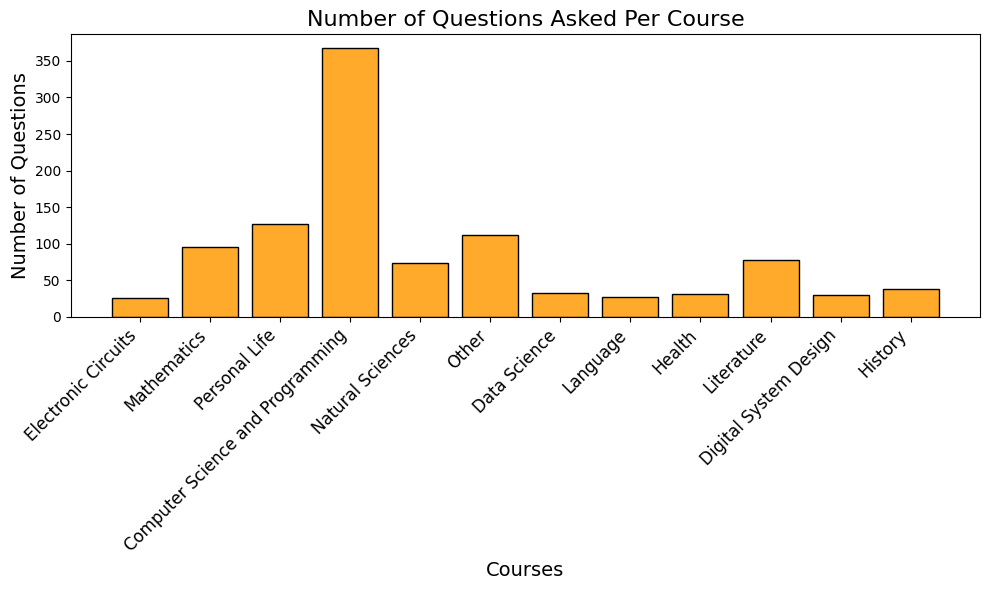

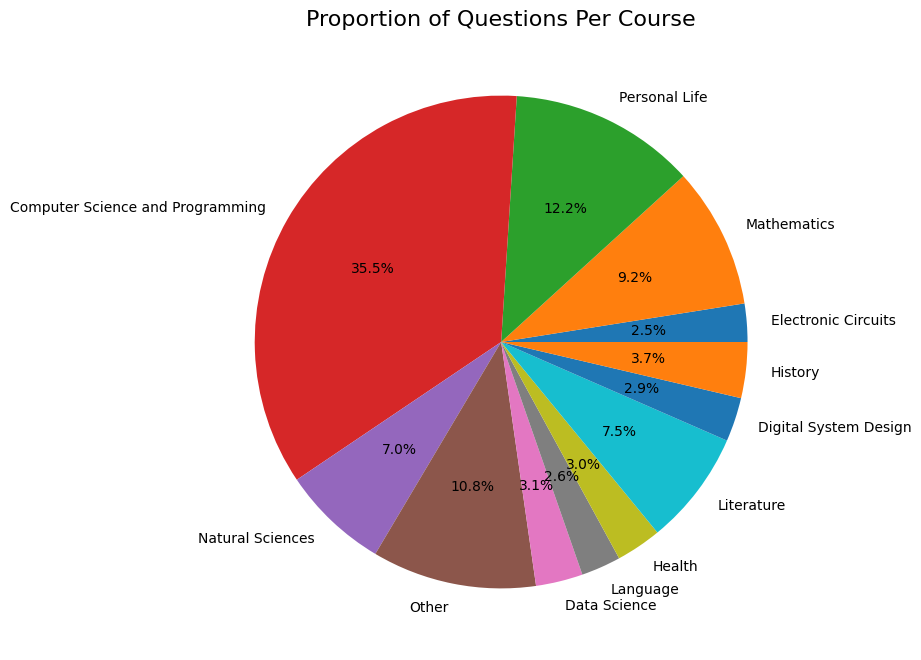

In [ ]:
import matplotlib.pyplot as plt

course_names = list(course_counts.keys())
question_counts = list(course_counts.values())

#Bar Chart
plt.figure(figsize=(10, 6))
plt.bar(course_names, question_counts, color='#ffaa2b', edgecolor='black')
plt.title("Number of Questions Asked Per Course", fontsize=16)
plt.xlabel("Courses", fontsize=14)
plt.ylabel("Number of Questions", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.tight_layout()
plt.show()

#Pie Chart
plt.figure(figsize=(8, 8))
plt.pie(question_counts, labels=course_names, autopct='%1.1f%%', colors=plt.cm.tab10.colors)
plt.title("Proportion of Questions Per Course", fontsize=16)
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119909 (\N{MATHEMATICAL ITALIC SMALL X}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119899 (\N{MATHEMATICAL ITALIC SMALL N}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


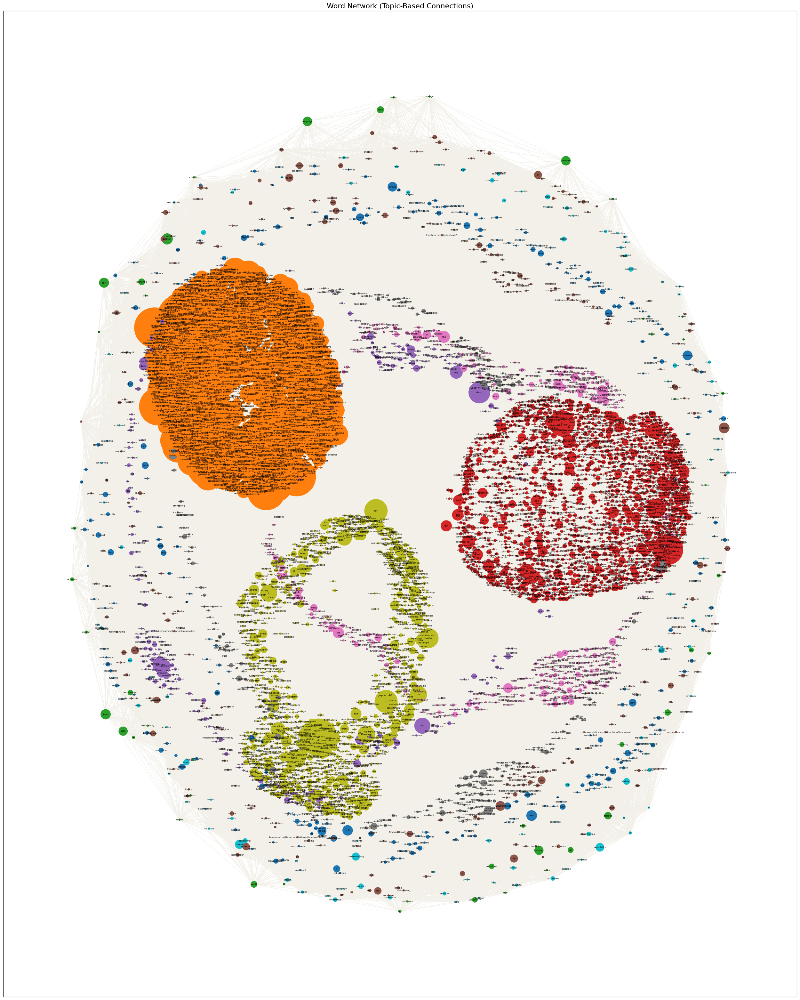

In [ ]:
import json
from collections import Counter, defaultdict
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations

with open("fully_labeled_messages.json", "r") as f:
    messages = json.load(f)

#Preprocess and Count Words
word_topic_counts = defaultdict(Counter)  #Format => {word: {topic: count}}
word_counts = Counter()

for msg in messages:
    words = msg['tokens']
    topic = msg['topic']
    for word in words:
        word_counts[word] += 1
        word_topic_counts[word][topic] += 1

#Determines the primary topic for each word
word_primary_topic = {word: max(topic_counts, key=topic_counts.get)
                      for word, topic_counts in word_topic_counts.items()}

#Assigns colors to topics
topics = list(set(word_primary_topic.values()))
topic_colors = {topic: plt.cm.tab10(i / len(topics)) for i, topic in enumerate(topics)}

#Graph
G = nx.Graph()

#Nodes
for word, count in word_counts.items():
    G.add_node(word, size=count, color=topic_colors[word_primary_topic[word]])

#Edges by topic
for topic in topics:
    topic_words = [word for word, t in word_primary_topic.items() if t == topic]

    # Connect every pair of words in the topic
    for word1, word2 in combinations(topic_words, 2):
        G.add_edge(word1, word2)

pos = nx.spring_layout(G, seed=42, k=0.9)  #Layout
node_sizes = [G.nodes[node]['size'] * 25 for node in G.nodes]
node_colors = [G.nodes[node]['color'] for node in G.nodes]

plt.figure(figsize=(32, 40))
nx.draw_networkx(G, pos, with_labels=True, node_size=node_sizes, node_color=node_colors, font_size=5, edge_color='#f2f0e9', linewidths=0.02)
plt.title("Word Network (Topic-Based Connections)", fontsize=16)
plt.show()
